In [1]:
import random
import numpy as np
import torchvision
from PIL import Image
import albumentations as A
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from albumentations.pytorch import ToTensorV2
import torchvision.transforms.functional as TF
from sklearn.model_selection import train_test_split
from torch.utils.data.sampler import SubsetRandomSampler
from torchvision.transforms import ToTensor
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
#======================================
import os
import shutil
import random

from os import listdir
from bs4 import BeautifulSoup
from os.path import isfile, join

#=====================================
import cv2
from matplotlib import pyplot as plt
import matplotlib.patches as patches
#=====================================
import torch
import torch.nn as nn
from torch import optim
from torchvision import ops
import torch.nn.functional as F
import torchvision.models as models
from torch.optim import lr_scheduler
#=====================================
from tqdm.auto import tqdm

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


<div class="alert alert-success" style="background-color: #1877f2; color: white; text-align: center;">
    <h1 style="font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; color: inherit;">Объявление путей и основных параметров</h1>
    <h1 style="font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; color: inherit;">Declaring paths and basic parameters</h1>
</div>


In [2]:
path_to_annot='/kaggle/input/face-mask-detection/annotations/'
path_to_img='/kaggle/input/face-mask-detection/images/'

#==============================================================================
Bath_size = 4
Learn_rate = 0.001
Num_epoch = 10
Size_of_img = 448
Num_workers = 0
PIN_MEMORY = False
#==============================================================================

class_dict = {"with_mask": 1, "without_mask": 2, "mask_weared_incorrect": 3}
class_dct_inv  = {1:'with_mask',2:"without_mask",3:"mask_weared_incorrect"}

#==============================================================================
torch.manual_seed(5017)
#==============================================================================

torch.cuda.manual_seed(5017)

In [3]:
def visual_firs_N_file(path_to_fold,num_of_pict,rows,colmn,size_x,size_y):

    plt.figure(figsize=(size_x, size_y))
    print(path_to_fold)
    for ind, img in enumerate(os.listdir(path_to_fold)):
        
        if ind==num_of_pict:
            break
        im = Image.open(path_to_fold+img)
        #print(im.size)
        plt.subplot(rows, colmn, ind+1)
        plt.imshow(im)
        im.close()

/kaggle/input/face-mask-detection/images/


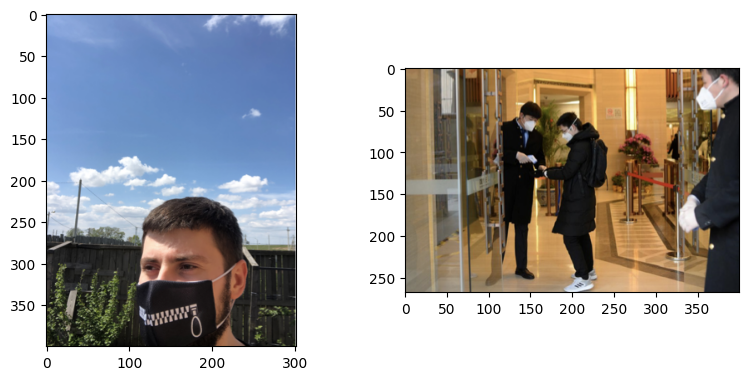

In [4]:
visual_firs_N_file(path_to_img,2,5,5,25,25)

<div class="alert alert-success" style="background-color: #1877f2; color: white; text-align: center;">
    <h1 style="font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; color: inherit;">Создание функций для работы </h1>
    <h1 style="font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; color: inherit;">Creating functions to work</h1>
</div>


In [5]:
def visual_the_sample(Data_dir,data_to_annot,indx,_transform=None):
    """
    to do: Реализовать для нескольких объектов и отрисовку боксов
    
    """
    dataset = Custom_dataset(path_to_imgs=Data_dir,
                             path_to_xml_files=data_to_annot,
                             transform=_transform)
    image, target = dataset[indx]  
    print(image)
    print( list(map(lambda x: class_dct_inv[x.item()] , target['labels'])))
    
    image = TF.to_pil_image(image)
    #----------------------------------------------
    
    bboxs = target['boxes']
    print(bboxs)
    
    for bbox in bboxs:
        x_min, y_min, x_max, y_max = bbox
        # Создать прямоугольник
        rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='r', facecolor='none')
        # Добавить прямоугольник к изображению
        plt.gca().add_patch(rect)

    plt.imshow(image)
    plt.axis('off')
    plt.show()

In [6]:
def get_loaders(BATCH_SIZE,
                Data_dir,
                data_to_annot,
                Num_workers,
                PIN_MEMORY,
                _transform_train=None,
                _transform_test=None,
                split_val=[0.7,0.2,0.1]):
    
    
    train_ds =  Custom_dataset(path_to_imgs=Data_dir,
                             path_to_xml_files=data_to_annot,
                             transform=_transform_train)
    
    val_ds = Custom_dataset(path_to_imgs=Data_dir,
                            path_to_xml_files=data_to_annot,
                          transform=_transform_test)
    
    data_indices=list(range(0,len(train_ds)))

    train_indices,test_val=train_test_split(data_indices,test_size=split_val[1]+split_val[2],random_state=42)
    print('Number of train samples :',len(train_indices))
    print('Number of val+test samples :',len(test_val))
    
    val_indices,test_indices  = train_test_split(test_val, test_size=split_val[2], random_state=42)
    print('Number of val samples :',len(val_indices))
    print('Number of test samples :',len(test_indices))
    

    train_sampler=SubsetRandomSampler(train_indices)
    valid_sampler=SubsetRandomSampler(val_indices)
    test_sampler=SubsetRandomSampler(test_indices)
    

    train_loader=DataLoader(train_ds,batch_size=BATCH_SIZE,num_workers=Num_workers,pin_memory=PIN_MEMORY,sampler=train_sampler,collate_fn=collate_fn)
    validation_loader=DataLoader(val_ds,batch_size=BATCH_SIZE,num_workers=Num_workers,pin_memory=PIN_MEMORY,sampler=valid_sampler,collate_fn=collate_fn)
    test_loader=DataLoader(val_ds,batch_size=BATCH_SIZE,num_workers=Num_workers,pin_memory=PIN_MEMORY,sampler=test_sampler,collate_fn=collate_fn)
    



    return train_loader,validation_loader,test_loader

In [7]:

bbox_params = A.BboxParams(
    format='pascal_voc',
    min_area=5,#5
    min_visibility=0.9,#0.9
#     check_each_transform =True,
    label_fields=['labels']
    
)

train_transform=A.Compose(
    [
        A.Resize(height=Size_of_img,width=Size_of_img),
#         A.Rotate(limit=30,p=0.5),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.1),
        ToTensorV2()
        
        
        
        
    ],
    bbox_params=bbox_params,
    is_check_shapes=False
)


test_transform=A.Compose(
    [
       A.Resize(height=Size_of_img,width=Size_of_img),



        ToTensorV2(),
        
        
        
        
    ],
    bbox_params=bbox_params,
    is_check_shapes=False
)

In [8]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [9]:
def get_model_detection(num_classes):
    #--------------------------------------------------------------------------
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    #------------------------------------------------------------------------
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    
    #------------------------------------------------------------------------
    
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

In [10]:


def testing_model(model, loader, ny, nx, s_y, s_x):
    model.eval()
    images, targets = next(iter(loader))
    images = list(image.to(device, dtype=torch.float) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    
    fig, axis = plt.subplots(ny, nx, figsize=(s_y, s_x))
    loop = tqdm(loader)
    
    with torch.no_grad():
        prediction = model(images)
    
    for i, ax in enumerate(axis.flat):

            
            npimg = images[i].cpu().detach().numpy()
            npimg=np.transpose(npimg,(1,2,0))
          #  print(npimg.shape)

            for targ in range(len(targets[i]['boxes'])):
                box_targ = targets[i]['boxes'][targ].cpu().numpy()
                
                label_targ = targets[i]['labels'][targ].cpu().numpy()
                rect_targ = patches.Rectangle((int(box_targ[0]), int(box_targ[1])), int(box_targ[2]) - int(box_targ[0]), int(box_targ[3]) - int(box_targ[1]), linewidth=2, edgecolor='g', facecolor='none')
                ax.add_patch(rect_targ)
                ax.text(int(box_targ[0]) - 10, int(box_targ[1]) - 10, f'Label: {class_dct_inv[label_targ.item()]}', color='g')
            
            for pred in range(len(prediction[i]['boxes'])):
                box = prediction[i]['boxes'][pred].cpu().numpy()
                label = prediction[i]['labels'][pred].cpu().numpy()
                score = prediction[i]['scores'][pred].cpu().numpy()
                #print('Все скоры',score)
                
                if score >= 0.5:
                   
                    rect_pred = patches.Rectangle((int(box[0]), int(box[1])), int(box[2]) - int(box[0]), int(box[3]) - int(box[1]), linewidth=2, edgecolor='r', facecolor='none')
                    #print((int(box[0]), int(box[1])), int(box[2]) - int(box[0]), int(box[3]) - int(box[1]))
                    ax.add_patch(rect_pred)
                    ax.text(int(box[0]) - 10, int(box[1]) - 10, 
                            f'Label: {class_dct_inv[label.item()]}', color='r')
            ax.imshow(npimg)
          #  print("Следующее фото=================================")
            
    model.train()


In [11]:


def testing_model_only_targets(model, loader, ny, nx, s_y, s_x,thr_hold=0.7):
    model.eval()
    images, targets = next(iter(loader))
    images = list(image.to(device, dtype=torch.float) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    
    fig, axis = plt.subplots(ny, nx, figsize=(s_y, s_x))
    loop = tqdm(loader)
    
    with torch.no_grad():
        prediction = model(images)
    
    for i, ax in enumerate(axis.flat):

            
            npimg = images[i].cpu().detach().numpy()
            npimg=np.transpose(npimg,(1,2,0))
        

            
            for pred in range(len(prediction[i]['boxes'])):
                box = prediction[i]['boxes'][pred].cpu().numpy()
                label = prediction[i]['labels'][pred].cpu().numpy()
                score = prediction[i]['scores'][pred].cpu().numpy()
            
                
                if score >= thr_hold:
                   
                    rect_pred = patches.Rectangle((int(box[0]), int(box[1])), int(box[2]) - int(box[0]), int(box[3]) - int(box[1]), linewidth=2, edgecolor='r', facecolor='none')
            
                    ax.add_patch(rect_pred)
                    ax.text(int(box[0]) - 10, int(box[1]) - 10, 
                            f'Label: {class_dct_inv[label.item()]}', color='r')
            ax.imshow(npimg)
          #  print("Следующее фото=================================")
            
    model.train()


In [12]:
def train_(loader,model,optimizer,lr_scheduler):
    loop=tqdm(loader)
    
    epoch_loss = 0

        
    for batch_indx,(datas,targets) in enumerate(loop):
        
        datas = list(image.to(device, dtype=torch.float) for image in datas)
        
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        
        loss_dict = model(datas, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

       

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        
        epoch_loss += losses
        
    if lr_scheduler is not None:
        lr_scheduler.step()
        
    print(epoch_loss)
        
        

In [13]:


def calculate_metrics(model, test_loader, threshold_score=0.5,threshold_ios=0.5):
    model.eval()
    all_true_positives = []
    all_false_positives = []
    all_false_negatives = []
    all_ious = []

    with torch.no_grad():
        
        
        
        for images, targets in test_loader:
            images = list(image.to(device, dtype=torch.float) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            predictions = model(images)

            for i in range(len(targets)):
                true_boxes = targets[i]['boxes'].cpu()
                true_labels = targets[i]['labels'].cpu().numpy()
                pred_boxes = predictions[i]['boxes'].cpu()
                pred_scores = predictions[i]['scores'].cpu().numpy()
                
                #print(true_labels)
                # Применяем пороговый скор для предсказаний
                pred_boxes_thr = pred_boxes[pred_scores >= threshold_score]
                
                pred_labels = np.ones(len(pred_boxes_thr))  # Предполагаем, что все предсказания являются объектами
                
                iou_for_img=ops.box_iou(pred_boxes_thr,true_boxes)
                #print(iou_for_img)
                

                # Находим истинно-положительные, ложно-положительные и ложно-отрицательные
                true_positives = (iou_for_img > threshold_ios).sum()
                #print(true_positives)
                false_positives = len(pred_boxes) - true_positives
                false_negatives = len(true_boxes) - true_positives

                all_true_positives.append(true_positives)
                all_false_positives.append(false_positives)
                all_false_negatives.append(false_negatives)
                

    precision = sum(all_true_positives) / (sum(all_true_positives) + sum(all_false_positives))
    recall = sum(all_true_positives) / (sum(all_true_positives) + sum(all_false_negatives))
    f1 = 2 * (precision * recall) / (precision + recall)
    
    model.train()
    
    return precision, recall, f1



<div class="alert alert-success" style="background-color: #1877f2; color: white; text-align: center;">
    <h1 style="font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; color: inherit;">Создание датасета</h1>
    <h1 style="font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; color: inherit;">Creating a dataset</h1>
</div>


In [14]:


class Custom_dataset(torch.utils.data.Dataset):
    def __init__(self, path_to_imgs,path_to_xml_files,transform=None):
        self.path_to_imgs=path_to_imgs
        self.path_to_xml_files=path_to_xml_files
        self.transform=transform

        self.file_names    = os.listdir(self.path_to_imgs)

        self.file_paths    = [os.path.join(self.path_to_imgs, file_name) for file_name in self.file_names]

        
       

    def __getitem__(self, index: int):
        path_to_img=self.file_paths[index]
        
        #print(path_to_img)
        self.name=self.file_names[index]
        
        image = Image.open(path_to_img).convert('RGB')
        image = np.array(image)/255.0

        
   
        target=self.__generate_target(self.path_to_xml_files,self.name)

        if self.transform:
            
            augmentations = self.transform(image=image, bboxes=target['boxes'], labels=target['labels'])

            
            image = augmentations['image']
            
            target['boxes'] = torch.tensor(augmentations['bboxes'])


            
            target['labels'] = torch.tensor(augmentations['labels'])
            

            
        
        
       
        return image,target

####################################################################################33
    def __generate_target(self,path_to_xml,name_of_img):
        path_to_annot=os.path.join(path_to_xml,name_of_img.replace('png','xml'))
       
        
        boxes_lst = []
        labels_lst = []
        clases_lst=[]
        target = {}
        
        
        with open(path_to_annot, 'r') as file:
            xml_content = file.read()

      
        soup = BeautifulSoup(xml_content, 'xml')
        
        
        objects = soup.find_all('object')
        
        for obj in objects:

            name = obj.find('name').text
            xmin = int(float(obj.find('xmin').text))-1
            ymin = int(float(obj.find('ymin').text))-1
            xmax = int(float(obj.find('xmax').text))-1
            ymax = int(float(obj.find('ymax').text))-1
            
            labels_lst.append(name)
            boxes_lst.append([xmin,ymin,xmax,ymax])
            clases_lst.append(class_dict[name])
            
            
        target["boxes"]  =  torch.tensor(boxes_lst, dtype=torch.float32) 
        target["labels"]  =  torch.tensor(clases_lst, dtype=torch.int64)
            



        return target





    def __len__(self):
        return len(self.file_paths)

tensor([[[0.4588, 0.3667, 0.3318,  ..., 0.6358, 0.6220, 0.6549],
         [0.4178, 0.3527, 0.3316,  ..., 0.6208, 0.6048, 0.6094],
         [0.3538, 0.3309, 0.3313,  ..., 0.5975, 0.5781, 0.5386],
         ...,
         [0.1127, 0.1094, 0.1088,  ..., 0.9416, 0.9031, 0.8673],
         [0.0990, 0.0957, 0.0951,  ..., 0.9438, 0.9065, 0.8765],
         [0.0902, 0.0869, 0.0863,  ..., 0.9453, 0.9087, 0.8824]],

        [[0.4471, 0.3187, 0.2539,  ..., 0.6358, 0.6226, 0.6588],
         [0.3928, 0.2940, 0.2467,  ..., 0.6208, 0.6057, 0.6148],
         [0.3083, 0.2555, 0.2354,  ..., 0.5975, 0.5794, 0.5463],
         ...,
         [0.1096, 0.1095, 0.1095,  ..., 0.9532, 0.9150, 0.8791],
         [0.1073, 0.1053, 0.1049,  ..., 0.9545, 0.9203, 0.8883],
         [0.1059, 0.1026, 0.1020,  ..., 0.9553, 0.9237, 0.8941]],

        [[0.4471, 0.3088, 0.2192,  ..., 0.6465, 0.6292, 0.6588],
         [0.3825, 0.2738, 0.2060,  ..., 0.6282, 0.6081, 0.6119],
         [0.2820, 0.2193, 0.1854,  ..., 0.5997, 0.5753, 0.

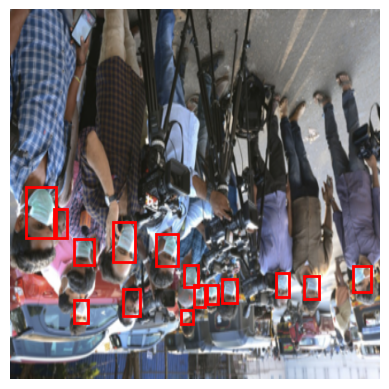

In [15]:
visual_the_sample(path_to_img,path_to_annot,17,_transform=train_transform)

<div class="alert alert-success" style="background-color: #1877f2; color: white; text-align: center;">
    <h1 style="font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; color: inherit;">Создание Загрузчика данных</h1>
    <h1 style="font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; color: inherit;">Creating a Model</h1>
</div>


In [16]:
train_loader,validation_loader,test_loader=get_loaders(Bath_size,path_to_img,path_to_annot,Num_workers,PIN_MEMORY,_transform_train=train_transform,_transform_test=test_transform,split_val=[0.75,0.15,0.10])

Number of train samples : 639
Number of val+test samples : 214
Number of val samples : 192
Number of test samples : 22


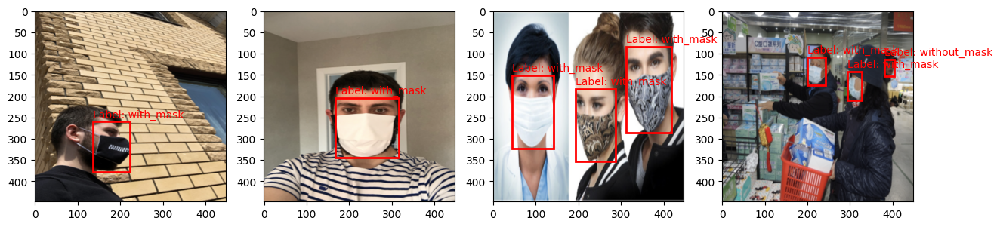

In [17]:
images,targets=next(iter(train_loader))
fig,axis=plt.subplots(1,4,figsize=(15,10))

for i,ax in enumerate(axis.flat):
    with torch.no_grad():
        npimg=images[i].numpy()
        npimg=np.transpose(npimg,(1,2,0))
        target=targets[i]
        
        bboxs = target['boxes'] 
        labels = target['labels']
        
        
        for bbox, label in zip(bboxs, labels): 
            x_min, y_min, x_max, y_max = bbox
            
            # Создать прямоугольник
            rect = patches.Rectangle((np.clip(x_min,0,Size_of_img), np.clip(y_min,0,Size_of_img)), np.clip(x_max,0,Size_of_img) - np.clip(x_min,0,Size_of_img), np.clip(y_max,0,Size_of_img) - np.clip(y_min,0,Size_of_img), linewidth=2, edgecolor='r', facecolor='none')
            # Добавить прямоугольник к изображению
            ax.add_patch(rect)
            ax.text(np.clip(x_min, 0, Size_of_img), np.clip(y_min, 0, Size_of_img) - 10, 
                    f'Label: {class_dct_inv[label.item()]}', color='r')
        ax.imshow(npimg)
       
        
        


<div class="alert alert-success" style="background-color: #1877f2; color: white; text-align: center;">
    <h1 style="font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; color: inherit;">Обучение модели</h1>
    <h1 style="font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif; color: inherit;">Creating a Model</h1>
</div>


In [18]:

device='cuda' if torch.cuda.is_available() else 'cpu'
model = get_model_detection(4)
model.to(device)


params = [p for p in model.parameters() if p.requires_grad]

optimizer = torch.optim.SGD(params, lr=0.005,
                                momentum=0.9, weight_decay=0.0005)

lr_scheduler  = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=6,
                                               gamma=0.7)



/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 238MB/s]


  0%|          | 0/160 [00:00<?, ?it/s]

tensor(74.9432, device='cuda:0', dtype=torch.float64, grad_fn=<AddBackward0>)
precision-0.10119862854480743, recall-0.6156250238418579, f1-0.1738235205411911


  0%|          | 0/6 [00:00<?, ?it/s]

-------------------------------- epoch-0/10 --------------------------------


  0%|          | 0/160 [00:00<?, ?it/s]

tensor(51.4904, device='cuda:0', dtype=torch.float64, grad_fn=<AddBackward0>)
precision-0.22664418816566467, recall-0.699999988079071, f1-0.34242039918899536


  0%|          | 0/6 [00:00<?, ?it/s]

-------------------------------- epoch-1/10 --------------------------------


  0%|          | 0/160 [00:00<?, ?it/s]

tensor(45.9900, device='cuda:0', dtype=torch.float64, grad_fn=<AddBackward0>)
precision-0.2376791387796402, recall-0.7083333134651184, f1-0.3559277653694153


  0%|          | 0/6 [00:00<?, ?it/s]

-------------------------------- epoch-2/10 --------------------------------


  0%|          | 0/160 [00:00<?, ?it/s]

tensor(42.6403, device='cuda:0', dtype=torch.float64, grad_fn=<AddBackward0>)
precision-0.20398293435573578, recall-0.746874988079071, f1-0.3204469382762909


  0%|          | 0/6 [00:00<?, ?it/s]

-------------------------------- epoch-3/10 --------------------------------


  0%|          | 0/160 [00:00<?, ?it/s]

tensor(41.2011, device='cuda:0', dtype=torch.float64, grad_fn=<AddBackward0>)
precision-0.2970212697982788, recall-0.7270833253860474, f1-0.4217522442340851


  0%|          | 0/6 [00:00<?, ?it/s]

-------------------------------- epoch-4/10 --------------------------------


  0%|          | 0/160 [00:00<?, ?it/s]

tensor(38.3156, device='cuda:0', dtype=torch.float64, grad_fn=<AddBackward0>)
precision-0.2968369722366333, recall-0.762499988079071, f1-0.4273205101490021


  0%|          | 0/6 [00:00<?, ?it/s]

-------------------------------- epoch-5/10 --------------------------------


  0%|          | 0/160 [00:00<?, ?it/s]

tensor(33.4326, device='cuda:0', dtype=torch.float64, grad_fn=<AddBackward0>)
precision-0.4275318384170532, recall-0.734375, f1-0.5404369235038757


  0%|          | 0/6 [00:00<?, ?it/s]

-------------------------------- epoch-6/10 --------------------------------


  0%|          | 0/160 [00:00<?, ?it/s]

tensor(32.2942, device='cuda:0', dtype=torch.float64, grad_fn=<AddBackward0>)
precision-0.44215625524520874, recall-0.7604166865348816, f1-0.5591727495193481


  0%|          | 0/6 [00:00<?, ?it/s]

-------------------------------- epoch-7/10 --------------------------------


  0%|          | 0/160 [00:00<?, ?it/s]

tensor(30.2934, device='cuda:0', dtype=torch.float64, grad_fn=<AddBackward0>)
precision-0.39911308884620667, recall-0.75, f1-0.5209841132164001


  0%|          | 0/6 [00:00<?, ?it/s]

-------------------------------- epoch-8/10 --------------------------------


  0%|          | 0/160 [00:00<?, ?it/s]

tensor(29.3795, device='cuda:0', dtype=torch.float64, grad_fn=<AddBackward0>)
precision-0.4237681031227112, recall-0.7614583373069763, f1-0.5445064902305603


  0%|          | 0/6 [00:00<?, ?it/s]

-------------------------------- epoch-9/10 --------------------------------


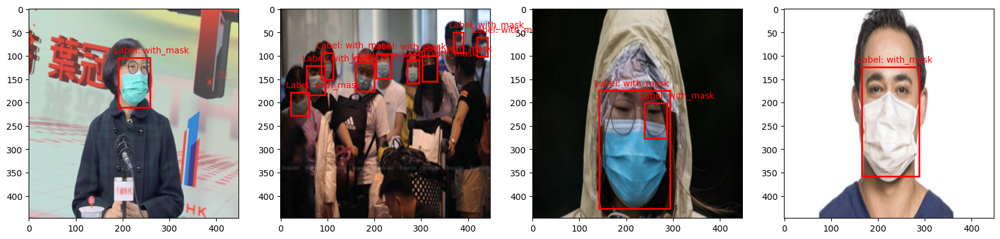

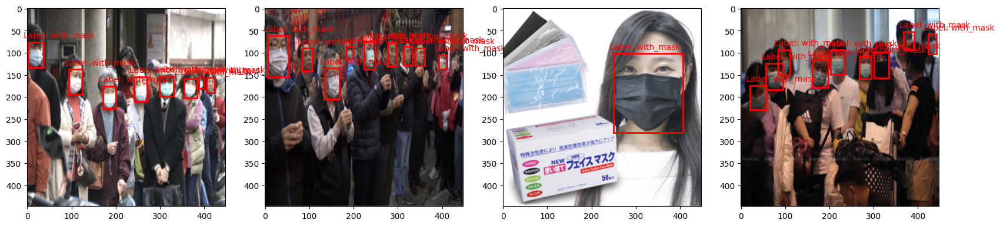

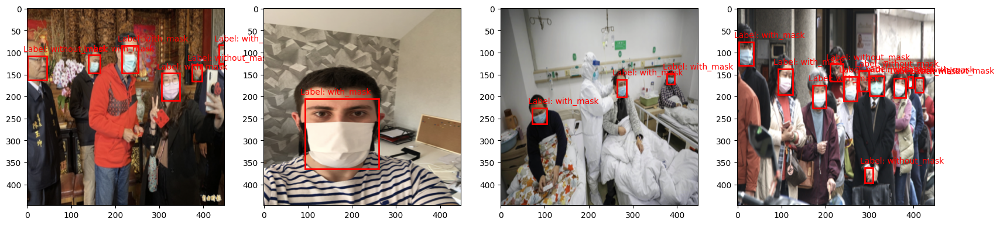

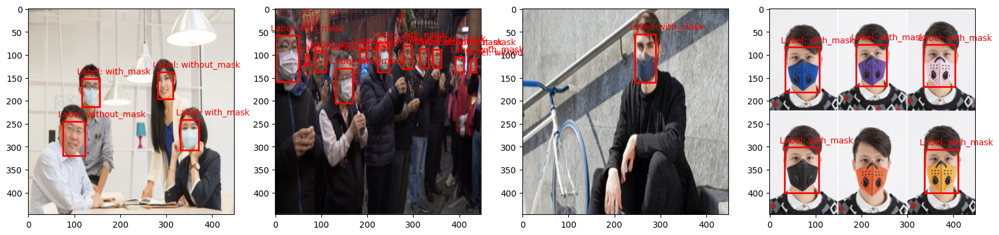

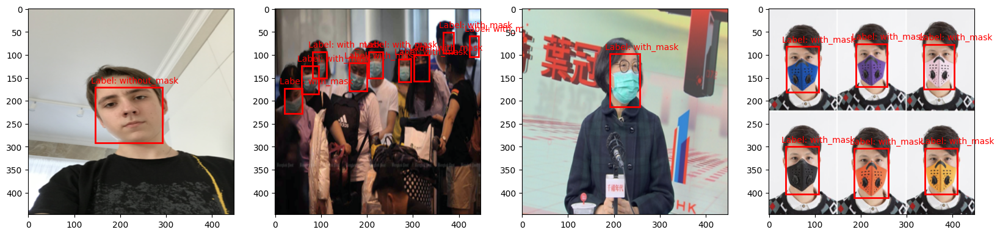

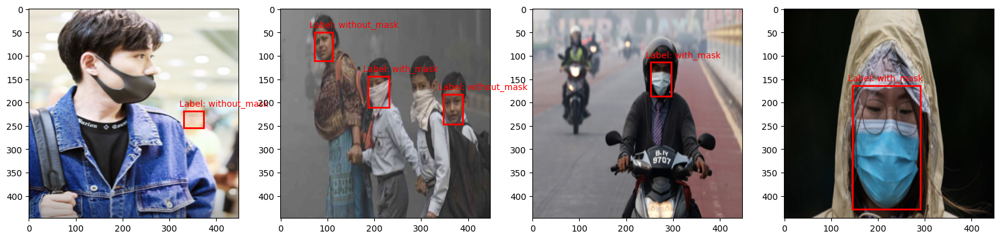

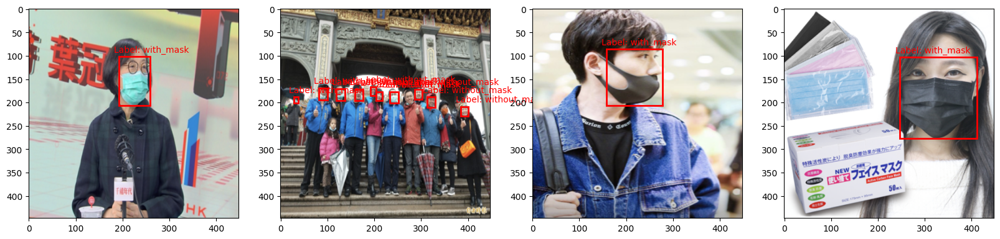

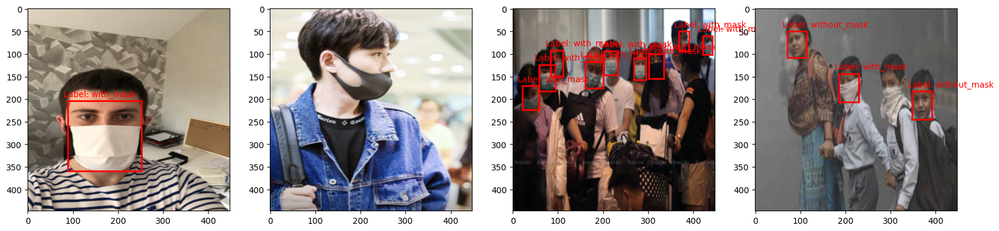

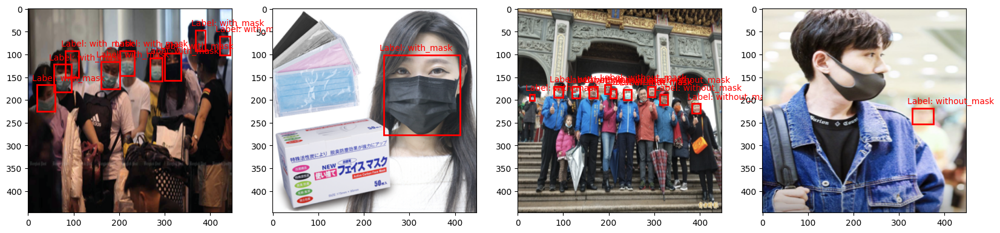

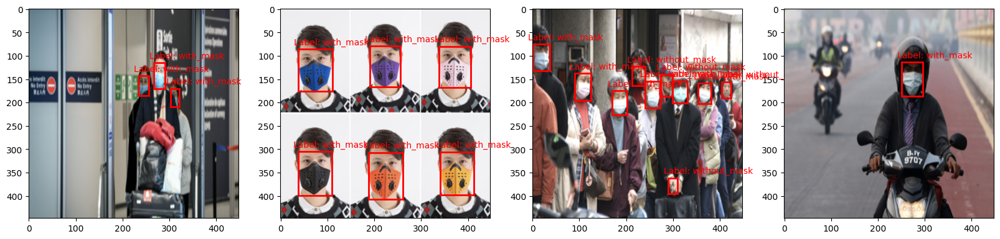

In [19]:
for epoch in range(Num_epoch):
    train_(train_loader,model,optimizer,lr_scheduler)
    
    precision, recall, f1 = calculate_metrics(model, validation_loader, threshold_score=0.7,threshold_ios=0.7)
    
    print(f'precision-{precision}, recall-{recall}, f1-{f1}')
    
    
    testing_model_only_targets(model,test_loader,1,4,20,20,thr_hold=0.8)
    
    print(f"-------------------------------- epoch-{epoch}/{Num_epoch} --------------------------------")

    



  0%|          | 0/6 [00:00<?, ?it/s]

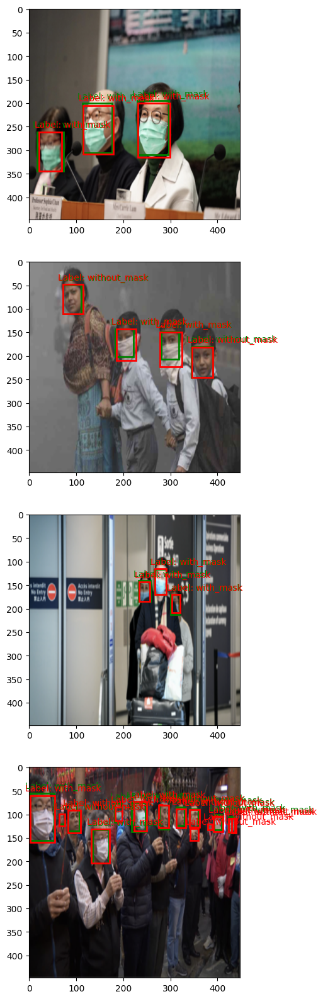

In [20]:
testing_model(model,test_loader,4,1,20,20)